In [38]:
import os
import gc
import pandas as pd
import numpy as np # fundamental package for scientific computing with Python
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from pandas.plotting import scatter_matrix


In [39]:
credit = pd.read_csv('input/default_of_credit_card_clients.csv', header =1)
credit.head()


,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [40]:
credit.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


### Remove id column, and check for missing data

In [41]:
credit = credit.drop(['ID'], axis=1)
credit.isnull().values.any()

False

There is no data missing so the pre processing part is simplier. 

The name of the target value is too long and with an unproper format. So a renaming was neccesary.

In [42]:
credit = credit.rename(columns={'default payment next month': 'TARGET'})

# Visualization

In [43]:
header = credit.dtypes.index
print(header)

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'TARGET'],
      dtype='object')


Checking for binning candidates

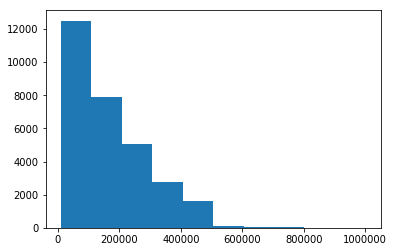

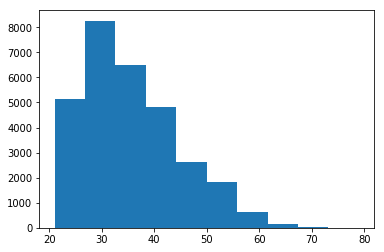

In [46]:
plt.hist(credit['LIMIT_BAL'])
plt.show()
plt.hist(credit['AGE'])
plt.show()

Candidates for binning: Age

Checking for outliers mainly

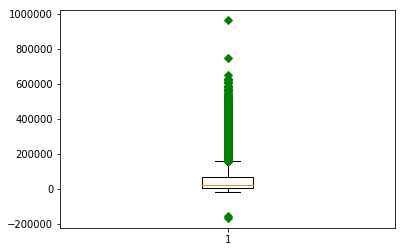

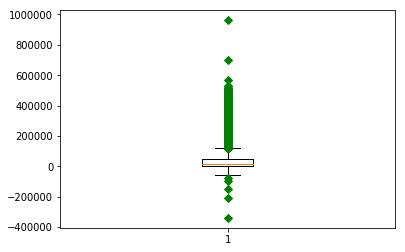

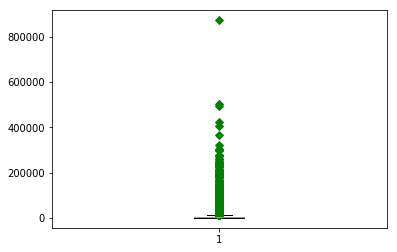

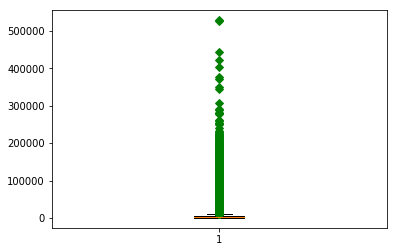

In [45]:
BMT1 = credit['BILL_AMT1']
BMT6 = credit['BILL_AMT6']
PMT1 = credit['PAY_AMT1']
PMT6= credit['PAY_AMT6']

plt.boxplot(BMT1,0,'gD')
plt.show()
plt.boxplot(BMT6,0,'gD')
plt.show()
plt.boxplot(PMT1,0,'gD')
plt.show()
plt.boxplot(PMT6,0,'gD')
plt.show()

There are a lot of outliers, and since we will be dealing with credit scoring. A model to take in consideration outliers will be a neccesary

# Correlation Matrix

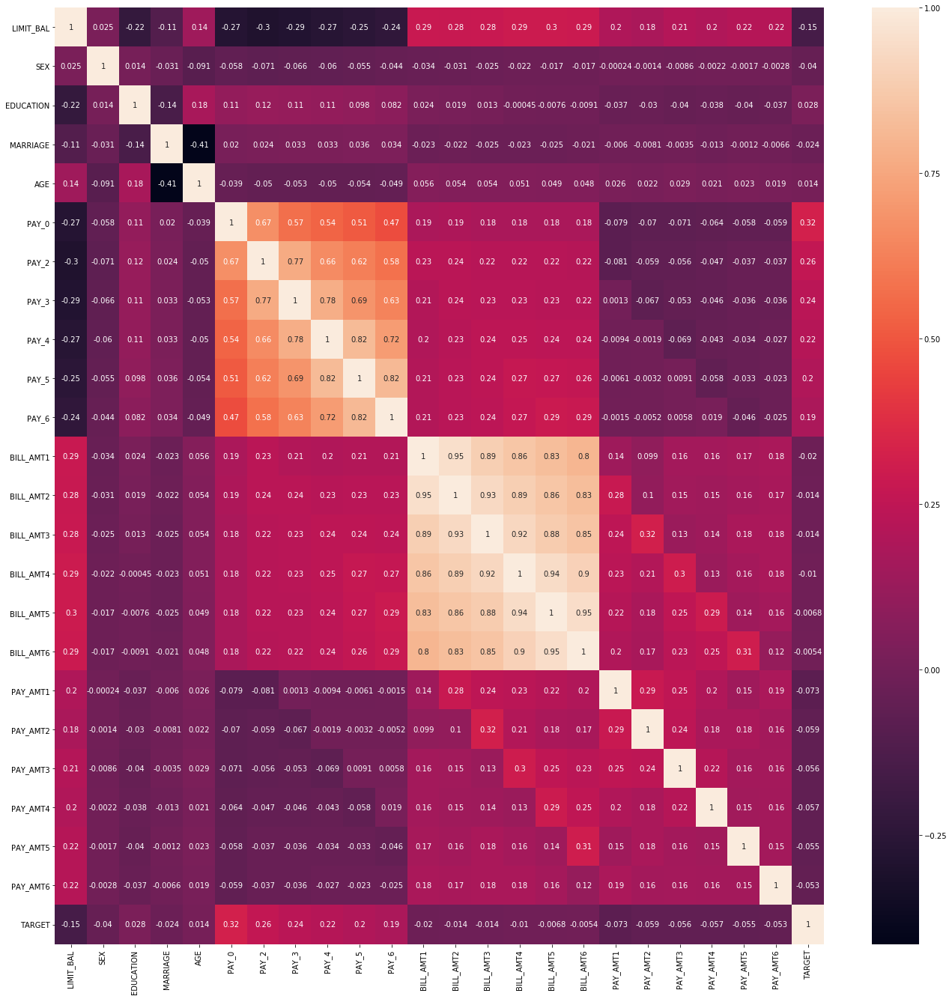

In [44]:
f, ax = plt.subplots(figsize = (23,23))
sns.heatmap(credit.corr(),annot= True)
plt.show()

There is a lot of correlation between features inside features of the same category, so it could be handy to treat those features, during the modeling specially on BILL_AMT. PAY since to have a negative correlation with LIMIT_BAL so there is something we will need to check for the modeling.

In [47]:
# Covariance Matrix

In [48]:
covMat = credit.cov()
print(covMat)

              LIMIT_BAL          SEX     EDUCATION     MARRIAGE  \
LIMIT_BAL  1.683446e+10  1571.050630 -22474.028945 -7323.669658   
SEX        1.571051e+03     0.239247      0.005502    -0.008014   
EDUCATION -2.247403e+04     0.005502      0.624651    -0.059184   
MARRIAGE  -7.323670e+03    -0.008014     -0.059184     0.272452   
AGE        1.730767e+05    -0.409726      1.275380    -1.992764   
PAY_0     -3.954593e+04    -0.031685      0.093584     0.011683   
PAY_2     -4.603765e+04    -0.041442      0.115025     0.015122   
PAY_3     -4.443225e+04    -0.038694      0.107861     0.020421   
PAY_4     -4.057181e+04    -0.034411      0.100528     0.020213   
PAY_5     -3.667056e+04    -0.030521      0.087340     0.021074   
PAY_6     -3.509308e+04    -0.024754      0.074816     0.020616   
BILL_AMT1  2.727020e+09 -1211.694332   1372.377644  -902.154685   
BILL_AMT2  2.570130e+09 -1085.595467   1054.657595  -802.517866   
BILL_AMT3  2.548533e+09  -833.207432    712.664124  -901.67908

### SCATTER PLOT MATRIX

In [49]:
scatter_matrix(credit,  figsize = (200, 200))
plt.show() ##Double click the plot to zoom

### Label Encoding is not neccesary

# Transformation

In [50]:
##Binning
bins = [20, 30, 40, 50, 60, 100]
credit['AGE'] = np.searchsorted(bins,credit['AGE'].values)

In [51]:
credit['AGE'].unique()

array([1, 2, 4, 3, 5], dtype=int64)

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'TARGET'],
      dtype='object')

In [52]:
y = credit['TARGET'].values
X_categorical = credit[['SEX','EDUCATION','MARRIAGE','AGE']].values
X_quantitaty = credit.drop(['TARGET','SEX','EDUCATION','MARRIAGE','AGE'], axis=1).values
X = credit.drop(['TARGET'], axis=1).values

In [54]:
X_categorical.shape

(30000, 4)

In [55]:
X_quantitaty.shape

(30000, 19)

I choose to go with a PCA, so more of the preprocessing will be perform automatically.

Sure thing. Just separately scale and one-hot-encode the separate columns as needed:

In [56]:
from sklearn.preprocessing import OneHotEncoder
from sklearn import preprocessing

# 1. INSTANTIATE
enc = preprocessing.OneHotEncoder()

# 2. FIT
enc.fit(X_categorical)

# 3. Transform
X_categorical = enc.transform(X_categorical).toarray()
X_categorical

C:\Users\TheShogun\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:363: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


array([[0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 1., 0., 0.],
       [1., 0., 0., ..., 1., 0., 0.]])

In [57]:
# Apply transform to both the training set and the test set.
scaler = StandardScaler()
scaler.fit(X_quantitaty)

X_quantitaty = scaler.transform(X_quantitaty)
X_quantitaty

C:\Users\TheShogun\Anaconda3\lib\site-packages\sklearn\utils\validation.py:590: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Users\TheShogun\Anaconda3\lib\site-packages\sklearn\utils\validation.py:590: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


array([[-1.13672015,  1.79456386,  1.78234817, ..., -0.30806256,
        -0.31413612, -0.29338206],
       [-0.3659805 , -0.87499115,  1.78234817, ..., -0.24422965,
        -0.31413612, -0.18087821],
       [-0.59720239,  0.01486052,  0.1117361 , ..., -0.24422965,
        -0.24868274, -0.01212243],
       ...,
       [-1.05964618,  3.57426721,  2.61765421, ..., -0.03996431,
        -0.18322937, -0.11900109],
       [-0.67427636,  0.90471219, -0.72356993, ..., -0.18512036,
         3.15253642, -0.19190359],
       [-0.90549825,  0.01486052,  0.1117361 , ..., -0.24422965,
        -0.24868274, -0.23713013]])

In [58]:
type(X_categorical)

numpy.ndarray

In [59]:
X_categorical.shape

(30000, 18)

In [60]:
X_quantitaty.shape

(30000, 19)

In [61]:
X = np.column_stack((X_categorical, X_quantitaty))
X.shape

(30000, 37)

In [62]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)


In [63]:
# Make an instance of the Model
pca = PCA(.95)
pca.fit(X_train)
X_train = pca.transform(X_train)
X_test = pca.transform(X_test)
X_train

array([[-1.75051741, -0.20323251, -0.58548882, ...,  0.11949   ,
        -0.64640194,  0.11144354],
       [-2.94512207,  2.75230736, -0.44583226, ..., -0.55133917,
         0.14020854,  0.14000248],
       [-2.68450274,  1.93494704, -0.48933749, ..., -0.82900028,
         0.88096397, -0.1339575 ],
       ...,
       [ 0.91538969, -2.88056172,  0.33688664, ...,  0.12754248,
        -0.44829856, -0.40796333],
       [ 0.46247483, -1.15187063, -0.13023756, ..., -0.9610074 ,
        -0.39965396,  0.0562556 ],
       [-3.00676942,  1.09570254, -0.91599421, ...,  0.12479529,
        -0.68748646, -0.11928831]])

In [64]:
numcols = len(X_train[0]) # 2 columns in your example
count_col = credit.shape[1]  # gives number of col count

print("Columns before PCA", count_col)
print("Columns after PCA", numcols)

Columns before PCA 24
Columns after PCA 17


There is a huge change in columns after the PCA. In order to assest if the PCA worked correctly I will perform the modeling part with PCA transformation and without to check accuracy metrics.

# MODELING

## KNN

In [65]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score


neigh = KNeighborsClassifier(n_neighbors=3)
neigh.fit(X_train, y_train) 
predicted = neigh.predict(X_test)
accuracy = accuracy_score(y_test, predicted)
accuracy

0.7736666666666666

In [66]:
from sklearn.ensemble import RandomForestClassifier
clf=RandomForestClassifier(n_estimators=100)
clf.fit(X_train,y_train)
predicted = clf.predict(X_test)
accuracy = accuracy_score(y_test, predicted)
accuracy

0.8067777777777778

In [67]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn import tree

des_tree = DecisionTreeClassifier(criterion = "gini", random_state = 100,
                               max_depth=3, min_samples_leaf=5)
des_tree.fit(X_train, y_train)

predicted = des_tree.predict(X_test)

accuracy = accuracy_score(y_test, predicted)
accuracy

0.8011111111111111

In [68]:
des_tree_entropy = DecisionTreeClassifier(criterion = "entropy", random_state = 100,
 max_depth=3, min_samples_leaf=5)
des_tree_entropy.fit(X_train, y_train)

predicted = des_tree_entropy.predict(X_test)

accuracy = accuracy_score(y_test, predicted)
accuracy

0.8012222222222222

In [69]:
from sklearn.naive_bayes import GaussianNB
gauss = GaussianNB()
gauss.fit(X_train, y_train)
predicted = gauss.predict(X_test)
accuracy = accuracy_score(y_test, predicted)
accuracy

0.7312222222222222

In [70]:
from sklearn.neural_network import MLPClassifier
mlp = MLPClassifier(hidden_layer_sizes=(15,15,15))
mlp.fit(X_train,y_train)
predicted = mlp.predict(X_test)
accuracy = accuracy_score(y_test, predicted)
accuracy

C:\Users\TheShogun\Anaconda3\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:562: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


0.8108888888888889

In [71]:
from sklearn.model_selection import GridSearchCV
mlp = MLPClassifier(max_iter=100)
parameter_space = {
    'hidden_layer_sizes': [(17,17,17), (17,34,17), (34,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive'],
}
mlp = GridSearchCV(mlp, parameter_space, n_jobs=-1, cv=2)
mlp.fit(X_train,y_train)
print('Best parameters found:\n', mlp.best_params_)
predicted = mlp.predict(X_test)
accuracy = accuracy_score(y_test, predicted)
accuracy

Best parameters found:
 {'activation': 'relu', 'alpha': 0.05, 'hidden_layer_sizes': (34,), 'learning_rate': 'constant', 'solver': 'adam'}


0.8131111111111111

In [75]:
from sklearn.model_selection import GridSearchCV
mlp = MLPClassifier(max_iter=100)
parameter_space = {
    'hidden_layer_sizes': [(17,17,17), (12,12,12), (1,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive'],
}
mlp = GridSearchCV(mlp, parameter_space, n_jobs=-1, cv=2)
mlp.fit(X_train,y_train)
print('Best parameters found:\n', mlp.best_params_)
predicted = mlp.predict(X_test)
accuracy = accuracy_score(y_test, predicted)
accuracy

Best parameters found:
 {'activation': 'tanh', 'alpha': 0.05, 'hidden_layer_sizes': (1,), 'learning_rate': 'constant', 'solver': 'sgd'}


0.8151111111111111

In [76]:
from sklearn.model_selection import GridSearchCV
mlp = MLPClassifier(max_iter=100)
parameter_space = {
    'hidden_layer_sizes': [(17,17,17), (10,10), (1,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive'],
}
mlp = GridSearchCV(mlp, parameter_space, n_jobs=-1, cv=2)
mlp.fit(X_train,y_train)
print('Best parameters found:\n', mlp.best_params_)
predicted = mlp.predict(X_test)
accuracy = accuracy_score(y_test, predicted)
accuracy

Best parameters found:
 {'activation': 'tanh', 'alpha': 0.05, 'hidden_layer_sizes': (1,), 'learning_rate': 'constant', 'solver': 'adam'}


0.8154444444444444

In [78]:
from sklearn.model_selection import GridSearchCV
mlp = MLPClassifier(max_iter=100)
parameter_space = {
    'hidden_layer_sizes': [(17,17,17), (10,10), (1,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive'],
}
mlp = GridSearchCV(mlp, parameter_space, n_jobs=-1, cv=10)
mlp.fit(X_train,y_train)
print('Best parameters found:\n', mlp.best_params_)
predicted = mlp.predict(X_test)
accuracy = accuracy_score(y_test, predicted)
accuracy

Best parameters found:
 {'activation': 'tanh', 'alpha': 0.05, 'hidden_layer_sizes': (1,), 'learning_rate': 'adaptive', 'solver': 'adam'}


0.8152222222222222